# ***Proyecto: Clasificación de genotipos de porotos con técnicas de Aprendizaje Automático***

## ***Introducción***

El poroto es una de las leguminosas más producidas y consumidas a nivel mundial. Debido a la gran diversidad genética que existe, la tarea de categorizar las semillas correctamente cobra preponderancia.

Existen otras razones por las cuales clasificar semillas en general es relevante: desde el punto de vista del productor agrícola, le permite adoptar técnicas de cultivo <u>sustentables</u>. Esto es porque ciertos cultivos (como los de porotos) absorben el exceso de nitrógeno depositado en el suelo por plantaciones previas (por ejemplo, las de soja), logrando aplicar efectivamente la *rotación de cultivos*. Además, el agricultor puede seleccionar las semillas que cumplan con ciertos estándares establecidos en base a la clasificación para obtener así un rendimiento mayor. Desde el punto de vista del vendedor, aquellos granos que se venden mezclados pierden mucho valor de venta. Es por lo tanto imprescindible lograr segmentarlos para poder cobrar el precio acorde a cada variedad.

La clasificación manual, contemplada dentro de las técnicas tradicionales, demanda mucho tiempo e involucra procesos innecesariamente exhaustivos, particularmente a gran escala. Por ello, es imperioso desarrollar un modelo automático capaz de clasificar adecuadamente los genotipos de porotos según sus características, optimizando así la eficiencia de toda la cadena productiva.


---
\
## ***Objetivos***

+ Desarrollar un modelo para obtener semillas de porotos de la misma variedad, partiendo de una población con genotipos distintos.
+ Evaluar el rendimiento de los distintos métodos de aprendizaje automático aplicados como posibles modelos.


---
\
## ***Dataset: Dry Beans***

El análisis y clasificación de porotos se realizará sobre el [Dry Beans Dataset](https://archive.ics.uci.edu/dataset/602/dry+bean+dataset) del UCI Machine Learning Repository. Dicho dataset fue originado con el fin de tratar el problema de clasificación utilizando aprendizaje automático y visión por computadora por [*(Koklu & Özkan, 2020)*](https://www.sciencedirect.com/science/article/pii/S0168169919311573?via%3Dihub).

El trabajo de investigación anterior destaca respecto a las publicaciones previas en temas similares porque logra tratar el problema de procesamiento de imágenes en base a características distintas del **color**, dado que la población a analizar en este caso posee todas variedades de color blanco salvo una. Además, se intenta de resolver el problema sobre un *volumen grande* de muestras.

Anterior a la obtención de características, el artículo aborda un problema de visión por computadora, donde se describe la adquisición, procesamiento y posterior segmentación de imágenes con porotos. La muestra consta de 1kg de semillas mezcladas previamente clasificadas por un *productor certificado*, basándose en los estándares explicitados por el Instituto de Estándares de Turquía. Separándose la muestra en grupos y utilizando un fondo oscuro, se tomaron <u>236 imágenes</u> con una cámara de alta resolución para obtener un total de <u>13611 semillas</u>. Luego, del proceso de segmentación, se lograron extraer 12 caracterísiticas *dimensionales* y 4 de *borde/figura*.

🔍 En el siguiente enlace puede observarse la segmentación y las distintas variedades obtenidas [(**imagen**)](https://ars.els-cdn.com/content/image/1-s2.0-S0168169919311573-gr11.jpg).

### <u>*Variedades*</u>

Los genotipos de porotos considerados son:
 + **Cali**: Color: blanco. Sus semillas son ligeramente infladas y poseen forma de riñón.
 + **Horoz**: Semillas largas, cilíndricas, blancas y de tamaño mediano.
 + **Dermason**: Semilla blanca más chata respecto al resto, con bordes redondos.
 + **Seker**: Semillas grandes, blancas con forma redonda.
 + **Bombay**: Es la especie más grande, de color blanco, y su morfología es ovalada y abultada.
 + **Barbunya**: Es de color beige con rayas rojas. Su forma es ovalada casi redonda.
 * **Sira**: Semillas pequeñas, de color blanco, su forma es chata con un extremo chato y el otro redondo.

### <u>*Diccionario de características*</u>

Las características obtenidas fueron (todas expresadas en cantidad de pixeles):

1. **Area** (A)
   Área del poroto (proyección 2D), i.e. cantidad de pixeles dentro de su borde.
   $$
    A = \sum_{r,c \in R} 1
   $$
   donde $(r, c)$  representan una coordenada en la región $R$.

2. **Perimeter** (P)  
   Perímetro del poroto.

3. **Major Axis Length** (L)
   Mayor distancia entre puntos del contorno del poroto.

4. **Minor Axis Length** (l)
   Línea de mayor longitud que puede ser dibujada perpendicular al eje mayor.

5. **Aspect Ratio** (K)  
   Relación entre **L**  y **l**
   $$ K = \frac{L}{l} $$

6. **Eccentricity** (Ec)  
   Excentricidad del elipse.

7. **Convex Area** (C)  
   Número de pixeles del polígono convexo más chico que logra cubrir el área del poroto.

8. **Equivalent Diameter** (Ed)
   Diámetro del círculo con área equivalente a la del poroto.
   $$ Ed = \sqrt{\frac{4A}{\pi}} $$

9. **Extent** (Ex)
   Ratio entre el margen producido por la segmentación y el área del poroto  
   $$ Ex = \frac{A}{A_B} $$  
   donde  
   - $A_B$ = Área de la caja rectangular

10. **Solidity** (S)  
    Tambíen conocido como **Convexity**. El ratio de pixeles entre el polígono convexo y el área del poroto
    $$ S = \frac{A}{C} $$

11. **Roundness** (R)
    Desviación respecto a un círculo  
    $$ R = \frac{4\pi A}{P^2} $$

12. **Compactness** (CO)
    Mide cuán elongado es el poroto
    $$ CO = \frac{E_d}{L} $$

13. **Shape Factor 1** (SF1)
     
    $$ SF1 = \frac{L}{A} $$

14. **Shape Factor 2** (SF2)  
     
    $$ SF2 = \frac{l}{A} $$

15. **Shape Factor 3** (SF3)
     
    $$ SF3 = \frac{A}{\frac{L^2}{4} \pi} $$

16. **Shape Factor 4** (SF4)
     
    $$ SF4 = \frac{A}{\frac{L}{2} \frac{l}{2} \pi} $$

17. **Class** (y)
    Clase del poroto. Puede obtener los valores:
    BARBUNYA, SIRA, HOROZ, DERMASON, CALI, BOMBAY, y SEKER.

---
\
## ***Análisis Exploratorio de Datos***

Esta etapa está centrada en obtener perspectivas sobre el dataset que nos guien hacia un análisis profundo sobre la relación entre las características que lo describen. Involucra limpieza, resumen y visualización de los datos.

Empezamos cargando el dataset, previamente transformado de `.xlsx` a `.csv`.

In [2]:
from google.colab import drive
drive.mount('/content/drive')
! ls drive/MyDrive/Colab\ Notebooks/Ciencia\ de\ Datos/proyecto

Mounted at /content/drive
 borrador_proyecto.ipynb
 dry_bean_dataset_csv.csv
 dry_bean_dataset.xlsx
 GuiaProyecto2025.pdf
'Koklu,Ozkan (2020)- Multiclass classification of dry beans using computer vision and machine.pdf'
 proyecto.ipynb


In [3]:
import pandas as pd

beans = pd.read_csv("drive/MyDrive/Colab Notebooks/Ciencia de Datos/proyecto/dry_bean_dataset_csv.csv")

beans.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


Podemos observar que la columna `roundness` tiene un formato distinto respecto a las demás y hay un error ortográfico en `AspectRatio`.

In [4]:
beans.rename(columns= {'roundness': 'Roundness', 'AspectRation': 'AspectRatio'}, inplace=True)
beans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRatio      13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  Roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

Del output anterior podemos decir que no hay entradas nulas para ninguno de los atributos. Todas las columnas son de tipo numérico, salvo **Class** que es de tipo categórico (representa la variedad de poroto). Esta última será nuestra variable target.

In [90]:
beans.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRatio,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,Roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


La tabla anterior nos muestra que las magnitudes entre las distintas columnas son <u>muy</u> disímiles. Esto jugará en contra de los modelos dependientes de escala, por lo tanto será necesario aplicar algún tipo de escaleo sobre los datos.

Veamos a continuación la distribución de clases:

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64 



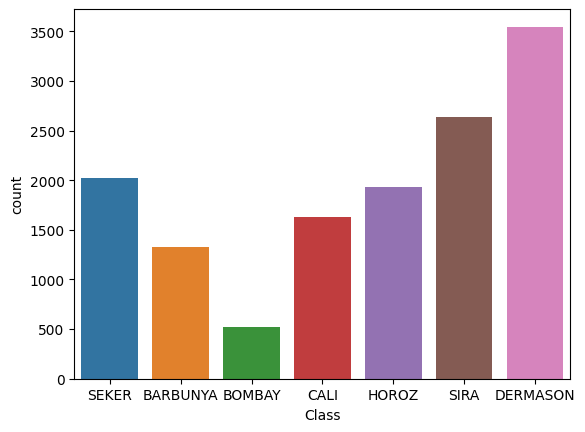

In [91]:
import seaborn as sns

print(beans['Class'].value_counts(), '\n')
_ = sns.countplot(x=beans['Class'], hue=beans.Class, data= beans)

Es claro que existe un imbalance entre las clases, particularmente **BOMBAY** siendo la que posee menos representación. La más frequente es **DERMASON**.

Para hacer un análisis más granular respecto del comportamiento de la clase minoritaria, puesto que puede estar muy solapada respecto de otra/as y resulta imposible distinguirla, o ser muy distinta al resto, relizaremos boxplots para cada característica, distinguiendo **por clase**.

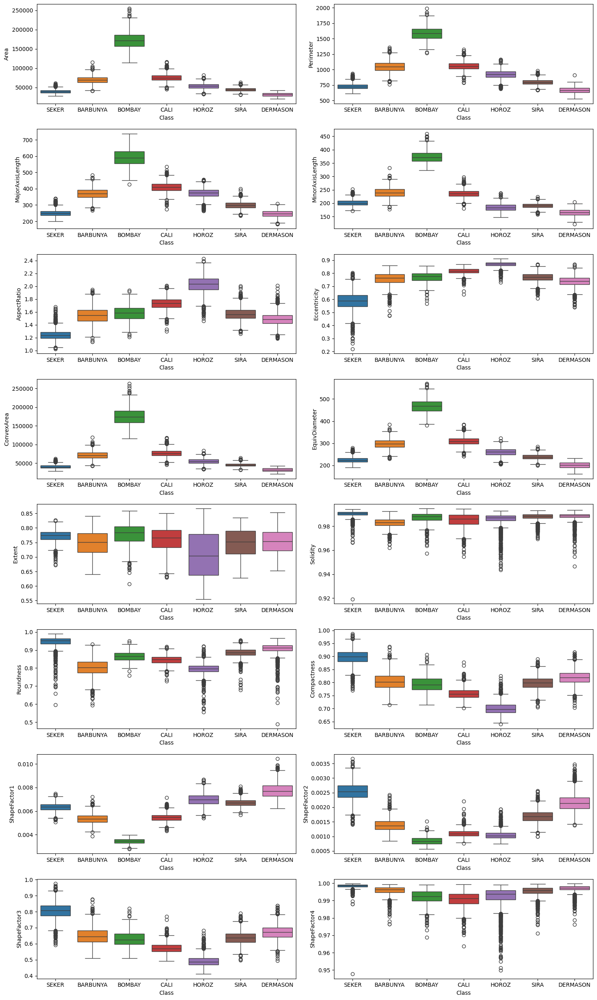

In [29]:
from matplotlib import pyplot as plt

numeric_cols = beans.drop(columns=['Class']).columns
fig, ax = plt.subplots(8, 2, figsize=(15, 25))
for variable, subplot in zip(numeric_cols, ax.flatten()):
    sns.boxplot(x=beans['Class'], y= beans[variable], ax=subplot, hue=beans['Class'])
plt.tight_layout()

- Podemos observar que **BOMBAY** es muy distinta respecto de las otras variedades en la mayoría de los atributos. En muchos casos, si graficáramos solo <u>un</u> boxplot por característica, todos los valores correspondientes a **BOMBAY** serían datos anómalos.

- Las clases **BARBUNYA** y **CALI** comprenden valores muy similares en varias características (Area, MinorAxisLength, EquivalentDiameter, Extent, Perimeter, etc.).

- La separación de **BOMBAY** es tal que si implementáramos una función que quite outliers utilizando como criterio los bigotes de los boxplots para cada caracteristica ($Q_1-\frac{3}{2}RIC$ y $Q_3+\frac{3}{2}RIC$ respectivamente), el dataset resultante tendría a la variedad eliminada por completo.

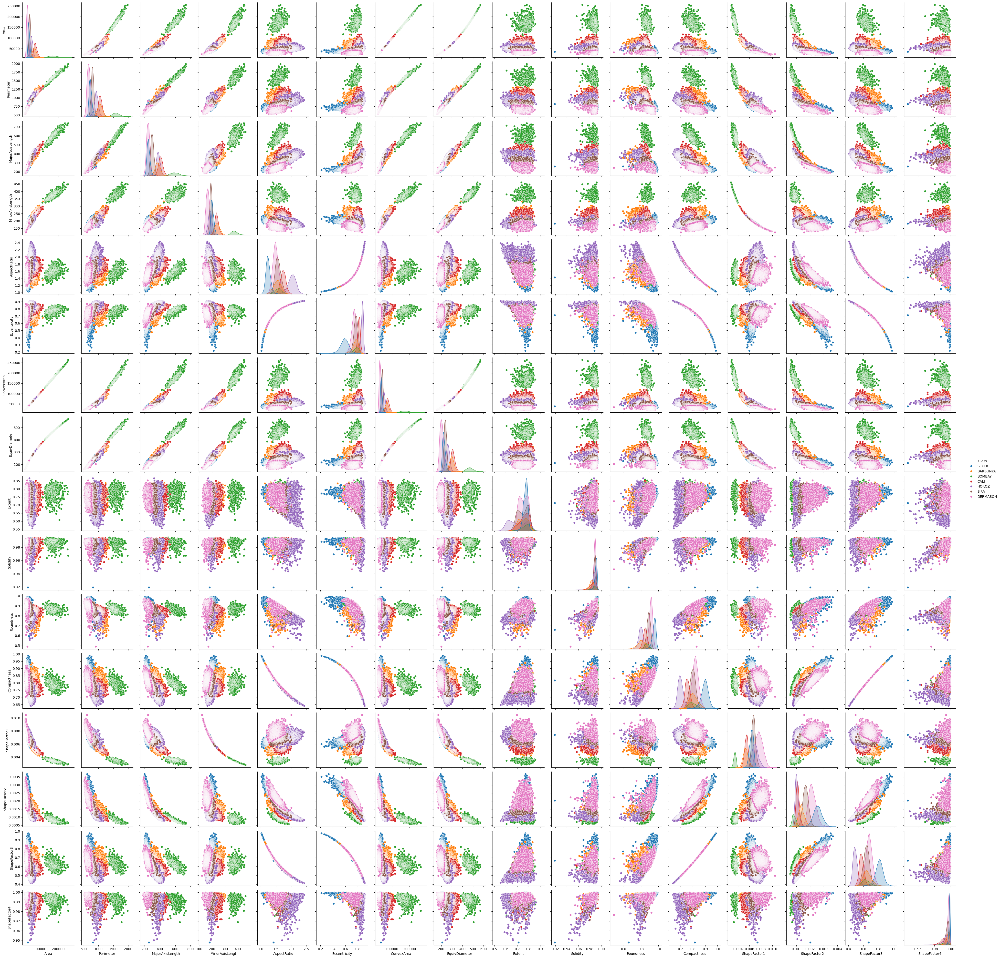

In [31]:
sns.pairplot(beans, hue='Class');

- Aquí verificamos nuevamente la separabilidad de **BOMBAY** respecto de las otras clases.
- Existe mucho solapamiento entre las demás 6 clases en las características Area, Perimeter y ConvexArea.
- Pueden observarse tendencias lineales en algunas características, especialmente entre Area y ConvexArea. Esto verifica que nuestro modelado del poroto como elipse (projectado en 2D) es un buen modelo.
- **HOROZ** presenta el mayor rango de variabilidad de sus valores en la mayoría de las características.

El hecho de que **BOMBAY** tenga pocas muestras y se encuentre muy separada de las demás puede presentar problemas a la hora de clasificar. Esto impactará directamente en los estimadores, aumentando su varianza. Sin embargo, antes de recurrir a técnicas de under/oversampling, utilizaremos el dataset sin modificar el tamaño de la muestra, midiendo métricas relevantes como ***Recall*** o ***F1-Score*** en cada clasificador y utilizando cross-validation. De esta manera preservamos la distribución empírica real de los datos. En caso de que falle, recurriremos a técnicas alternativas.

---
\
## ***Modelos de Clasificación***

### <u>*Preprocesamiento*</u>

Comenzaremos convirtiendo la variable target de categórica a numérica para que los modelos seleccionados funcionen adecuadamente. Utilizaremos `LabelEncoder()` en vez de `OneHotEncoder()` para evitar el aumento desmedido del espacio de características (contamos con 7 clases).

In [5]:
from sklearn.preprocessing import LabelEncoder
import numpy as np

le = LabelEncoder()
beans['Class'] = le.fit_transform(beans['Class'])
beans.Class.value_counts()

,count
Class,
3,3546
6,2636
5,2027
4,1928
2,1630
0,1322
1,522


Ahora separaremos el dataset, destinando el 80% de la muestra al training y 20% al testing.

In [6]:
from sklearn.model_selection import train_test_split

X = beans.drop('Class', axis=1)
y = beans['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Respecto al escaleo de datos, se realizará una estandarización de los mismos para evitar problemas de performance con los modelos de clasificación sensibles a escala desarrollados posteriormente.

In [7]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

Veamos si es factible efectuar una reducción del espacio de características utilizando `PCA()`:

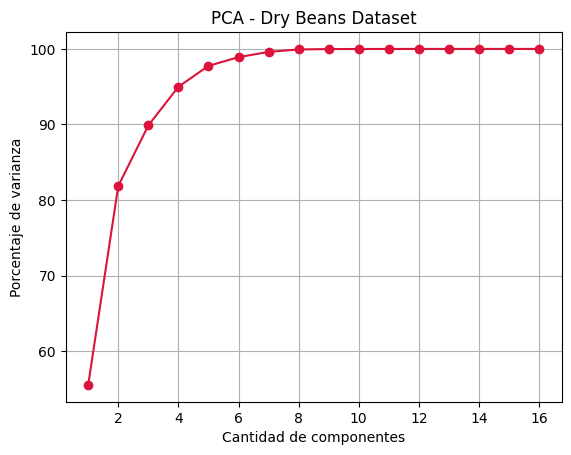


 Varianza acumulada con 9 componentes: 99.98152269703458


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

n_features = X.shape[1]
k = np.arange(1, n_features + 1)
y_r = np.zeros(n_features)

# Porcentaje de var para cada feature
for i in range(1, n_features + 1):
    pca = PCA(n_components=i)
    X_r = pca.fit_transform(X_train_scaled)
    y_r[i - 1] = sum(pca.explained_variance_ratio_) * 100

# Plot
plt.plot(k, y_r, marker="o", linestyle="-", color="crimson")
plt.xlabel("Cantidad de componentes")
plt.ylabel("Porcentaje de varianza")
plt.title("PCA - Dry Beans Dataset")
plt.grid()
plt.show()

# Varianza acumulada cercana al 100%
pca = PCA(n_components=9)
X_r = pca.fit_transform(X_train_scaled)
print('\n','Varianza acumulada con 9 componentes:',sum(pca.explained_variance_ratio_) * 100 )

Notemos que la elección `n_components=9` representa casi toda la varianza asociada al poblema. Esto significa que proseguir con la clasificación usando solo esa cantidad de características no implica pérdida de información, sino solo que se quitan aquellos atributos que son dependientes de otros. Preservar solo las componentes ortogonales permite además mejorar la estabilidad numérica de ciertos algoritmos.

Era esperable la presencia de sobredeterminación en las características ya que muchas de ellas son coeficientes derivados de otras mediciones.


In [10]:
pca = PCA(n_components=9)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

Todos los clasificadores que se detallarán en las siguientes subsecciones serán sometidos a cross-validation con `k=10` folds para poder evaluar su capacidad de generalización, además de compararlos por la métrica que se elija como la más adecuada.

### <u>*Logistic Regression CV*</u>

Este clasificador será considerado como *baseline*, dado que alcanza una performance razonable con muy poco tiempo de cómputo, además de realizar *fine-tuning* sobre su hiperparámetro *C*.

              precision    recall  f1-score   support

    BARBUNYA       0.92      0.91      0.92       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.94      0.94      0.94       317
    DERMASON       0.92      0.91      0.91       671
       HOROZ       0.97      0.96      0.97       408
       SEKER       0.97      0.94      0.96       413
        SIRA       0.84      0.90      0.87       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 2000x2000 with 0 Axes>

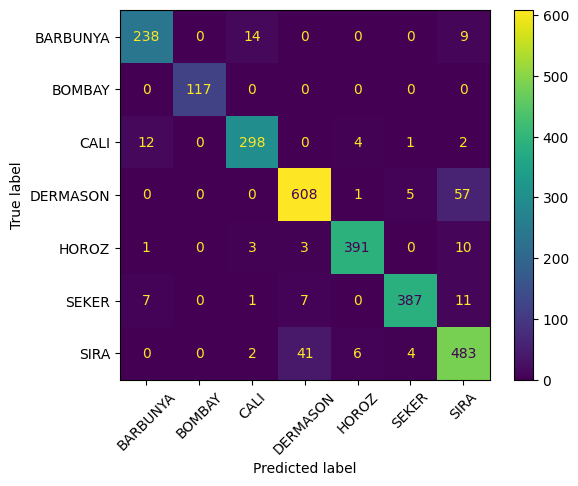


Mean Accuracy (cross-validation): 0.923677 ± 0.005986

Accuracy en el set de test: 0.926184

Mejor parámetro C obtenido con CV = 21.544346900318825


In [12]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import cross_val_score
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import(
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)

clf_log = LogisticRegressionCV(cv=5, penalty='l2', solver='lbfgs')
clf_log.fit(X_train_pca, y_train)

# Predicciones con la muestra de test
y_pred_log = clf_log.predict(X_test_pca)


# Accuracy en el set de test
acc_test_log = clf_log.score(X_test_pca, y_test)

# Cuadro de métricas
label_names = le.classes_
print(classification_report(y_test, y_pred_log, target_names=label_names))

# Matriz de confusión
fig = plt.figure(figsize=(20, 20))
cm = confusion_matrix(y_test, y_pred_log)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot()
plt.xticks(rotation=45)
plt.show()

# Cross-validation
scores_log = cross_val_score(clf_log, X_train_pca, y_train, cv=10, n_jobs=-1)
print(f"\nMean Accuracy (cross-validation): {scores_log.mean():.6f} ± {scores_log.std():.6f}")
print(f"\nAccuracy en el set de test: {acc_test_log:.6f}")

print(f"\nMejor parámetro C obtenido con CV = {np.mean(clf_log.C_)}")

\
### <u>*Radial Basis Function SVM*</u>

Dado que SVM fue el método que obtuvo la mejor *accuracy* y los valores más altos de métricas respecto de las demás técnicas analizadas en el paper, resulta interesante lograr ver cómo clasifica.

En el paper se detalla la utilización del esquema `one-vs-one`, y la utilzación de SVM con un kernel polinomial de grado `n=3`.

Utilizaremos el esquema `one-vs-one` dado que es más útil para tratar el problema de clases desbalanceadas, y puede llegar a ayudar en el solapamiento de clases (por ejemplo **CALI** y **BARBUNYA** mencionado antes). El kernel seleccionado es el gaussiano ya que supongo que logrará captar mejor la clase desbalanceada, y podrá recabar más información de los datos con una frontera de decisión distinta de la lineal.

Aplicaremos *cross-validation* dos veces. Esto nos permitirá obtener un estimador insesgado sobre la capacidad de generalización del clasificador y a su vez hacer *fine-tuning* de sus hiperparámetros. La CV del modelo se hará con `K=10` folds y la de búsqueda de hiperparámetros con `K=5`.


In [16]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit, cross_val_score

C_range = np.logspace(-1, 5, 7)
gamma_range = np.logspace(-6, 0, 7)
param_grid = dict(gamma=gamma_range, C=C_range)

# GridSearch para fine-tuning de hiperparámetros
svm = SVC(kernel='rbf')
grid_search = GridSearchCV(svm, param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train_pca, y_train)
print(f"Los mejores parámetros son: {grid_search.best_params_} con score {grid_search.best_score_}.")

Los mejores parámetros son: {'C': np.float64(100000.0), 'gamma': np.float64(0.001)} con score 0.9320352647449986.


Veamos una representación gráfica de la Validation Accuracy en función de `C` y `gamma`:

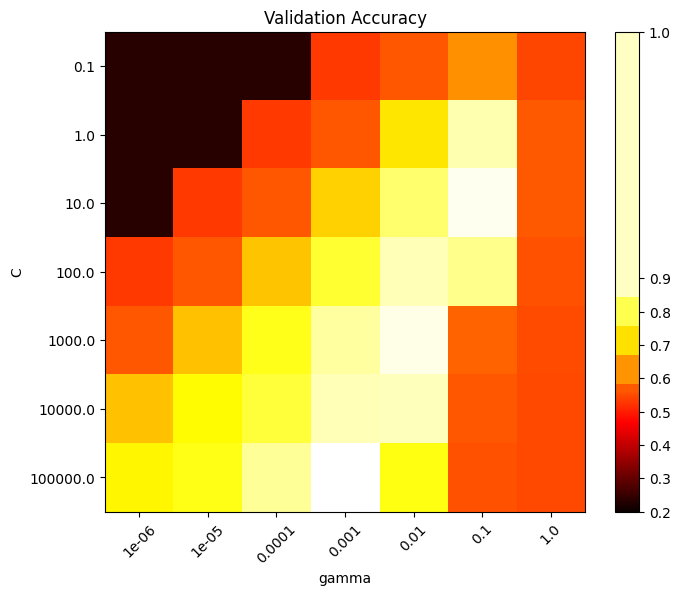

In [21]:
from matplotlib.colors import Normalize

scores_grid = grid_search.cv_results_["mean_test_score"].reshape(len(C_range), len(gamma_range))

# Para centrar alrededor de los puntos relevantes
class MidpointNormalize(Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

plt.figure(figsize=(8, 6))
plt.subplots_adjust(left=0.2, right=0.95, bottom=0.15, top=0.95)
plt.imshow(
    scores_grid,
    interpolation="nearest",
    cmap=plt.cm.hot,
    norm=MidpointNormalize(vmin=0.2, midpoint=0.92),
)
plt.xlabel("gamma")
plt.ylabel("C")
plt.colorbar()
plt.xticks(np.arange(len(gamma_range)), gamma_range, rotation=45)
plt.yticks(np.arange(len(C_range)), C_range)
plt.title("Validation Accuracy")
plt.show()

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.93      0.93       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.95      0.94      0.94       317
    DERMASON       0.91      0.93      0.92       671
       HOROZ       0.97      0.95      0.96       408
       SEKER       0.97      0.96      0.96       413
        SIRA       0.88      0.89      0.88       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 2000x2000 with 0 Axes>

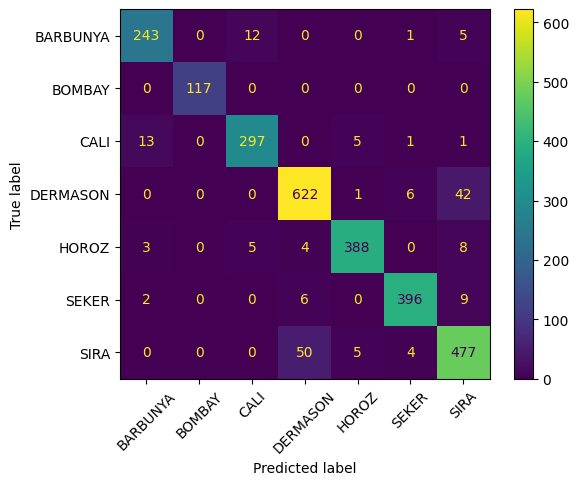


Mean Accuracy (cross-validation): 0.931759 ± 0.004670

Accuracy en el set de test: 0.932795


In [22]:
from sklearn.svm import SVC
from sklearn.metrics import(
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)


clf_rbf = SVC(C=10.0, kernel='rbf', gamma=0.1, random_state=42)
clf_rbf.fit(X_train_pca, y_train)

y_pred_rbf = clf_rbf.predict(X_test_pca)

# Accuracy en el set de test
acc_test_rbf = clf_rbf.score(X_test_pca, y_test)

# Cuadro de métricas
label_names = le.classes_
print(classification_report(y_test, y_pred_rbf, target_names=label_names))

# Matriz de confusión
plt.figure(figsize=(20, 20))
cm = confusion_matrix(y_test, y_pred_rbf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot()
plt.xticks(rotation=45)
plt.show()

# Cross-validation
scores_rbf = cross_val_score(clf_rbf, X_train_pca, y_train, cv=10, n_jobs=-1)
print(f"\nMean Accuracy (cross-validation): {scores_rbf.mean():.6f} ± {scores_rbf.std():.6f}")
print(f"\nAccuracy en el set de test: {acc_test_rbf:.6f}")

\
### <u>*Naïve Bayes*</u>

La suposición de que la muestra sigue una distribución normal no es desmedida cuando el número de instancias es lo suficientemente grande. Además, el tratamiento previo hecho con `PCA()` preservó solo las características no correlacionadas, por lo tanto la hipótesis de independencia entre características no es tan lejana.

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.87      0.90       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.92      0.93      0.93       317
    DERMASON       0.93      0.81      0.86       671
       HOROZ       0.94      0.96      0.95       408
       SEKER       0.99      0.92      0.95       413
        SIRA       0.74      0.91      0.82       536

    accuracy                           0.90      2723
   macro avg       0.92      0.91      0.92      2723
weighted avg       0.90      0.90      0.90      2723



<Figure size 2000x2000 with 0 Axes>

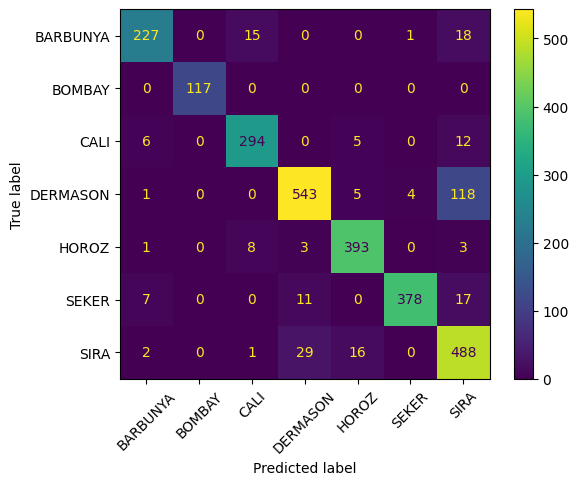


Mean Accuracy (cross-validation): 0.888226 ± 0.006488

Accuracy en el set de test: 0.896071


In [13]:
from sklearn.naive_bayes import GaussianNB

clf_nb = GaussianNB()
clf_nb.fit(X_train_pca, y_train)

# Predicciones con la muestra de test
y_pred_nb = clf_nb.predict(X_test_pca)

# Accuracy en el set de test
acc_test_nb = clf_nb.score(X_test_pca, y_test)

# Cuadro de métricas
label_names = le.classes_
print(classification_report(y_test, y_pred_nb, target_names=label_names))

# Matriz de confusión
fig = plt.figure(figsize=(20, 20))
cm = confusion_matrix(y_test, y_pred_nb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot()
plt.xticks(rotation=45)
plt.show()

# Cross-validation
scores_nb = cross_val_score(clf_nb, X_train_pca, y_train, cv=10, n_jobs=-1)
print(f"\nMean Accuracy (cross-validation): {scores_nb.mean():.6f} ± {scores_nb.std():.6f}")
print(f"\nAccuracy en el set de test: {acc_test_nb:.6f}")

\
### <u>*Random Forest*</u>

Basándonos en la implementación del árbol de decisión en el paper, optamos por un método de ensemble que logre contrarrestar las tendencias de sobreajuste, disminuyendo así la varianza del modelo. Particularmente, este modelo logra no solo modificar las hipótesis aprendidas mediante el muestreo *bootstrap* si no también añadir aleatoriedad en la selección de características para decidir los splits del árbol.

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.92       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.93      0.95      0.94       317
    DERMASON       0.91      0.91      0.91       671
       HOROZ       0.98      0.96      0.97       408
       SEKER       0.98      0.95      0.96       413
        SIRA       0.86      0.89      0.87       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 2000x2000 with 0 Axes>

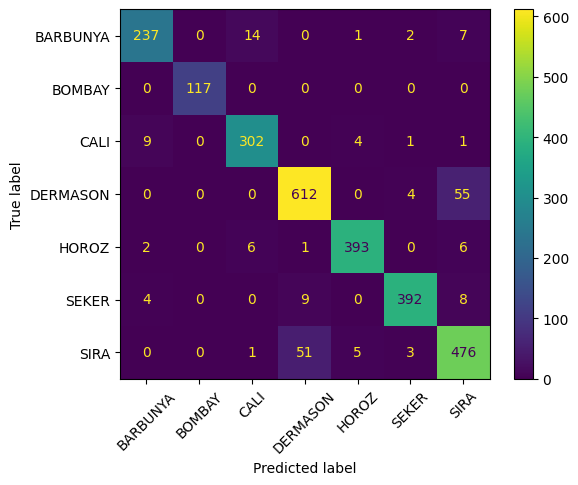


Mean Accuracy (cross-validation): 0.925698 ± 0.005599

Accuracy en el set de test: 0.928755


In [14]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rforest = RandomForestClassifier(n_estimators=200,
                                criterion = 'entropy',
                                max_depth = None,
                                max_features = 'sqrt',
                                min_samples_leaf = 2,
                                min_samples_split = 4,
                                class_weight = 'balanced',
                                random_state=42,
                                n_jobs=1)

rforest.fit(X_train_pca, y_train)

y_pred_rforest = rforest.predict(X_test_pca)

# Accuracy en el set de test
acc_test_rforest = rforest.score(X_test_pca, y_test)

# Cuadro de métricas
label_names = le.classes_
print(classification_report(y_test, y_pred_rforest, target_names=label_names))

# Matriz de confusión
fig = plt.figure(figsize=(20, 20))
cm = confusion_matrix(y_test, y_pred_rforest)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot()
plt.xticks(rotation=45)
plt.show()

# Cross-validation
scores_rforest = cross_val_score(rforest, X_train_pca, y_train, cv=10, n_jobs=-1)
print(f"\nMean Accuracy (cross-validation): {scores_rforest.mean():.6f} ± {scores_rforest.std():.6f}")
print(f"\nAccuracy en el set de test: {acc_test_rforest:.6f}")

Los valores de `min_samples_leaf` y `min_samples_split` se fueron aumentando gradualmente de forma manual desde (1,2) (puede producir overfitting en algunos casos) hasta que no se vio mejoría en la performance. Se utilizó entropía de Shannon, puesto que no surgieron preocupaciones respecto al tiempo de cómputo. Claramente puede observarse una mejora sustancial de las métricas respecto al árbol de decisión exhibido en el paper (con Accuracy de $0.8792$).

\
### <u>*Gradient Boosting*</u>

Siguiendo con métodos de ensemble, resulta intrigante tratar de buscar maneras de combinar árboles y decisiones para obtener una mejor clasificación. En este caso, cada modelo se agrega de manera secuencial y su objetivo es reducir el error residual del modelo anterior. La función de pérdida a optimizar es diferenciable y se utiliza descenso por el gradiente.  

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.91      0.92       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.94      0.94      0.94       317
    DERMASON       0.91      0.91      0.91       671
       HOROZ       0.96      0.97      0.96       408
       SEKER       0.98      0.94      0.96       413
        SIRA       0.86      0.88      0.87       536

    accuracy                           0.93      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.93      0.93      0.93      2723



<Figure size 2000x2000 with 0 Axes>

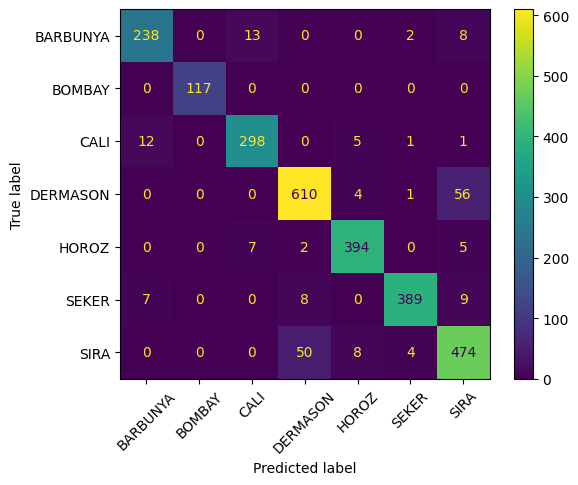


Mean Accuracy (cross-validation): 0.925147 ± 0.004913

Accuracy en el set de test: 0.925450


In [23]:
from sklearn.ensemble import GradientBoostingClassifier


boost = GradientBoostingClassifier(learning_rate=0.1,
                                   n_estimators=200,
                                   max_depth=5,
                                   random_state=42)

boost.fit(X_train_pca, y_train)

y_pred_boost = boost.predict(X_test_pca)

# Accuracy en el set de test
acc_test_boost = boost.score(X_test_pca, y_test)

# Cuadro de métricas
label_names = le.classes_
print(classification_report(y_test, y_pred_boost, target_names=label_names))

# Matriz de confusión
fig = plt.figure(figsize=(20, 20))
cm = confusion_matrix(y_test, y_pred_boost)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
disp.plot()
plt.xticks(rotation=45)
plt.show()

# Cross-validation
scores_boost = cross_val_score(boost, X_train_pca, y_train, cv=10, n_jobs=-1)
print(f"\nMean Accuracy (cross-validation): {scores_boost.mean():.6f} ± {scores_boost.std():.6f}")
print(f"\nAccuracy en el set de test: {acc_test_boost:.6f}")

### *Resultados de otras fuentes*

- El paper del problema obtuvo la mayor Accuracy con SVM. El resultado fue de $93.13 \%$ . Cabe destacar que no es la Accuracy sobre el conjunto test, sino la de validación.

- Hubo una competencia de Kaggle donde los datos se entregaban ya separados en train y test. El mejor resultado obtenido fue $94.92 \%$ de Accuracy, utilizando una red neuronal. Se aplicaron técnicas de oversampling. [(competencia)](https://www.kaggle.com/competitions/dry-beans-classification-iti-ai-pro-intake01/leaderboard)

---
\
## ***Conclusiones***

Construiremos primero una tabla que explicite las métricas obtenidas para cada uno de los métodos.

In [28]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

predictions = {
    "Logistic Regression CV": y_pred_log,
    "SVM RBF": y_pred_rbf,
    "Naïve Bayes": y_pred_nb,
    "Random Forest": y_pred_rforest,
    "Gradient Boosting": y_pred_boost,
}

results = []

for model_name, y_pred in predictions.items():
    results.append({
        "Model": model_name,
        "Precision": precision_score(y_test, y_pred, average='weighted') * 100,
        "Recall": recall_score(y_test, y_pred, average='weighted') * 100,
        "F1 Score": f1_score(y_test, y_pred, average='weighted') * 100,
        "Accuracy": accuracy_score(y_test, y_pred) * 100
    })

df_results = pd.DataFrame(results).set_index("Model").round(4)
print(df_results)



                        Precision   Recall  F1 Score  Accuracy
Model                                                         
Logistic Regression CV    92.7630  92.6184   92.6640   92.6184
SVM RBF                   93.3210  93.2795   93.2956   93.2795
Naïve Bayes               90.4766  89.6071   89.7462   89.6071
Random Forest             92.9491  92.8755   92.9012   92.8755
Gradient Boosting         92.6151  92.5450   92.5694   92.5450


Es claro que, en términos generales, SVM RBF es el modelo que obtiene los valores más altos para todas las métricas analizadas. Por el contrario, se puede ver que Naïve Bayes fue el clasificador con peor performance.

Se observa que las 4 métricas son similares para todos los modelos. Esto nos asegura que hay consistenciaa la hora de predecir cada una de las clases. Tomaremos como referencia Accuracy.

Si ahora analizamos la capacidad de generalización de cada modelo, se sigue que:

In [40]:
cv_scores = {
    "Logistic Regression": scores_log,
    "SVM RBF": scores_rbf,
    "Naïve Bayes": scores_nb,
    "Random Forest": scores_rforest,
    "Gradient Boosting": scores_boost
}

# Mean acc. x modelo
mean_scores = {model: round(np.mean(scores) * 100, 4) for model, scores in cv_scores.items()}

# df
df_cv_mean = pd.DataFrame.from_dict(mean_scores, orient='index', columns=['Mean Validation Accuracy (%)'])
df_cv_mean.index.name = "Model"
df_cv_mean = df_cv_mean.sort_values(by="Mean Validation Accuracy (%)", ascending=False)

print(df_cv_mean)


                     Mean Validation Accuracy (%)
Model                                            
SVM RBF                                   93.1759
Random Forest                             92.5698
Gradient Boosting                         92.5147
Logistic Regression                       92.3677
Naïve Bayes                               88.8226


Nuevamente vemos cómo SVM RBF logra obtener el mejor resultado de todos, seguido de Random Forest y Gradient Boosting. Más allá de que ocupan el segundo y tercer puesto, son muy buenas alternativas ya que nos permiten trabajar con muy poco preprocesamiento (podemos usar todas las características) y con targets categóricos. Lograron además mejorar significativamente la performance comparado al árbol de decisión utilizado en el paper.

Veamos ahora cómo rindió cada modelo respecto a los genotipos:

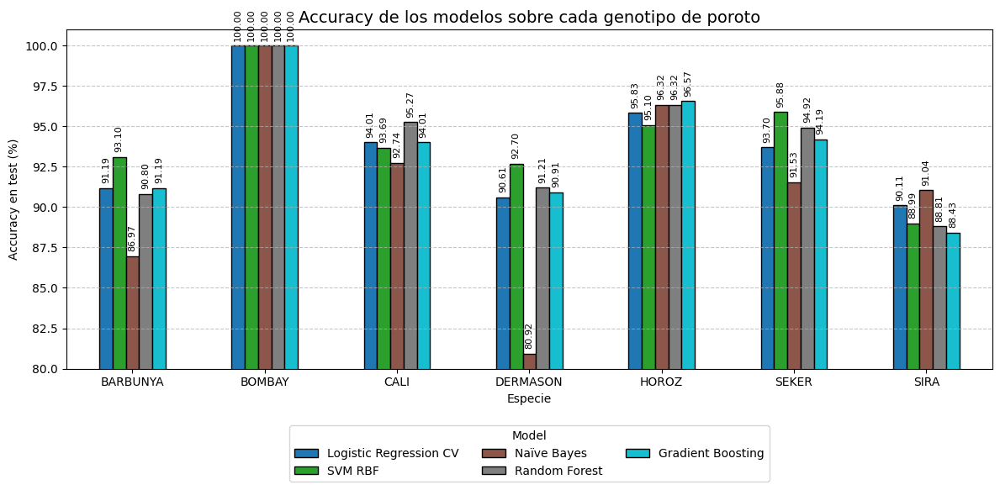

In [36]:
import matplotlib.pyplot as plt

classes = np.unique(y_test)
per_class_results = []

for class_label in classes:
    row = {"Variety": class_label}
    mask = y_test == class_label
    for model_name, y_pred in predictions.items():
        row[model_name] = accuracy_score(y_test[mask], y_pred[mask]) * 100
    per_class_results.append(row)

df_per_class = pd.DataFrame(per_class_results).set_index("Variety").round(4)

ax = df_per_class.plot(kind='bar', figsize=(12, 6), colormap='tab10', edgecolor='black')

plt.title("Accuracy de los modelos sobre cada genotipo de poroto", fontsize=14)
plt.ylabel("Accuracy en test (%)")
plt.xlabel("Especie")
plt.ylim(80, 101)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# valores
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2., height + 0.3),
                    ha='center', va='bottom', fontsize=8, rotation=90)

plt.legend(title="Model", loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
plt.tight_layout()
etiqueta_nombres = ['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']
ax.set_xticklabels(etiqueta_nombres, rotation=0)
plt.show()


- La peor capacidad de clasificación es sobre la especie **SIRA**, debido a su alto solapamiento con la variedad **DERMASON**. Claramente se favorece a esta última por tener la mayor cantidad de muestras. Esto también podía verse en las matrices de confusión de la sección anterior.
- El genotipo **BOMBAY** logra ser clasificado *perfectamente* por todos los modelos, reivindicando su separabilidad respecto a las demás. Es importante notar que los valores de *Precision* y *F1-Score* tambié dieron resultados altos, por lo tanto no fue necesario hacer modificaciones a la muestra. Se puede distinguir la variedad sin inconvenientes.

Los resultados obtenidos muestran que el proceso de selección de porotos puede ser fácilmente automatizado, con un desempeño de por lo menos $89 \%$. Incluso la posterior implementación de los algoritmos en lenguajes de más bajo nivel podría permitir instalarlos en los softwares de máquinas cosechadoras que cuenten con la tecnología adecuada y el sistema de visión por computadora previamente planteado.